## Figure 2A

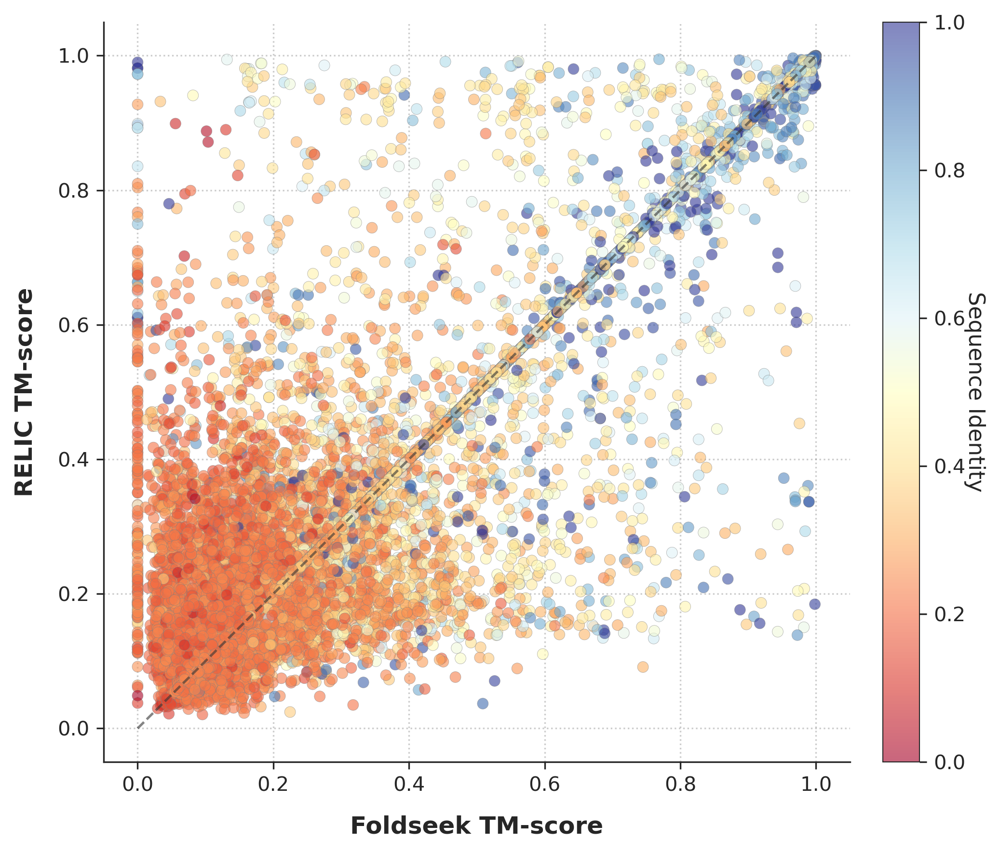

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
csv_file = "../RELIC_data/figure2A_D/Benchmark_With_SeqIdentity.csv"


df = pd.read_csv(csv_file)

sns.set_style("ticks")
plt.rcParams['font.family'] = 'sans-serif'
fig, ax = plt.subplots(figsize=(7, 6), dpi=300)
scatter = ax.scatter(
    x=df['Foldseek_TM'], 
    y=df['My_TM'], 
    c=df['Winner_Seq_Identity'], 
    cmap='RdYlBu',
    vmin=0, vmax=1,
    s=30,
    alpha=0.6,
    edgecolors='grey',
    linewidth=0.2
)

ax.plot([0, 1], [0, 1], color='#333333', linestyle='--', linewidth=1.2, alpha=0.6, label='y=x')

sns.despine(top=True, right=True)
ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xlabel('Foldseek TM-score', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('RELIC TM-score', fontsize=12, fontweight='bold', labelpad=10)
ax.grid(True, linestyle=':', alpha=0.4, color='gray', zorder=0)
cbar = plt.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Sequence Identity', fontsize=11, labelpad=10, rotation=270)
cbar.outline.set_linewidth(0.5)
plt.tight_layout()
plt.show()


## Figure 2B

Total pairs: 20215
Twilight Zone pairs (<30% SeqID): 9657
ProtWord Wins: 5197 (53.82%)


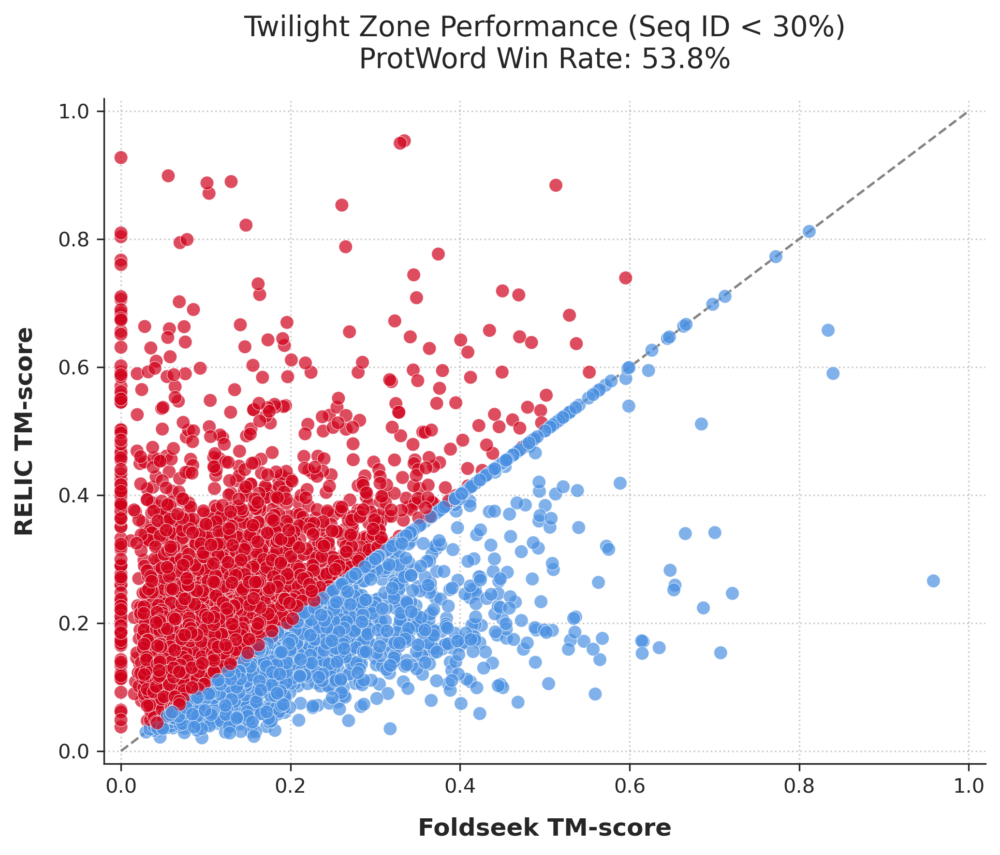

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.lines import Line2D 

# ================= 配置区域 =================
csv_file = "../RELIC_data/figure2A_D/Benchmark_With_SeqIdentity.csv"

COLOR_WIN = '#D0021B'
COLOR_LOSS = '#4A90E2'
COLOR_TIE = 'gray'

df = pd.read_csv(csv_file)

df_sub = df[df['Winner_Seq_Identity'] < 0.3].copy()

print(f"Total pairs: {len(df)}")
print(f"Twilight Zone pairs (<30% SeqID): {len(df_sub)}")

better_count = len(df_sub[df_sub['My_TM'] > df_sub['Foldseek_TM']])
win_rate = better_count / len(df_sub) * 100
print(f"ProtWord Wins: {better_count} ({win_rate:.2f}%)")

colors = np.where(df_sub['My_TM'] > df_sub['Foldseek_TM'], COLOR_WIN, COLOR_LOSS)

sns.set_style("ticks")

fig, ax = plt.subplots(figsize=(7, 6), dpi=300)

scatter = ax.scatter(
    x=df_sub['Foldseek_TM'], 
    y=df_sub['My_TM'], 
    c=colors,
    s=45,                   
    alpha=0.7,
    edgecolors='white',
    linewidth=0.3
)

ax.plot([0, 1], [0, 1], color='#333333', linestyle='--', linewidth=1.2, alpha=0.6, zorder=0)

sns.despine(top=True, right=True)

ax.set_xlim(-0.02, 1.02)
ax.set_ylim(-0.02, 1.02)
ax.set_xlabel('Foldseek TM-score', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('RELIC TM-score', fontsize=12, fontweight='bold', labelpad=10)

ax.set_title(f'Twilight Zone Performance (Seq ID < 30%)\nProtWord Win Rate: {win_rate:.1f}%', fontsize=14, pad=15)

ax.grid(True, linestyle=':', alpha=0.4, color='gray', zorder=0)

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='RELIC > Foldseek',
           markerfacecolor=COLOR_WIN, markersize=10),
    Line2D([0], [0], marker='o', color='w', label='Foldseek > RELIC',
           markerfacecolor=COLOR_LOSS, markersize=10)
]

plt.tight_layout()

plt.show()


## Figure 2C

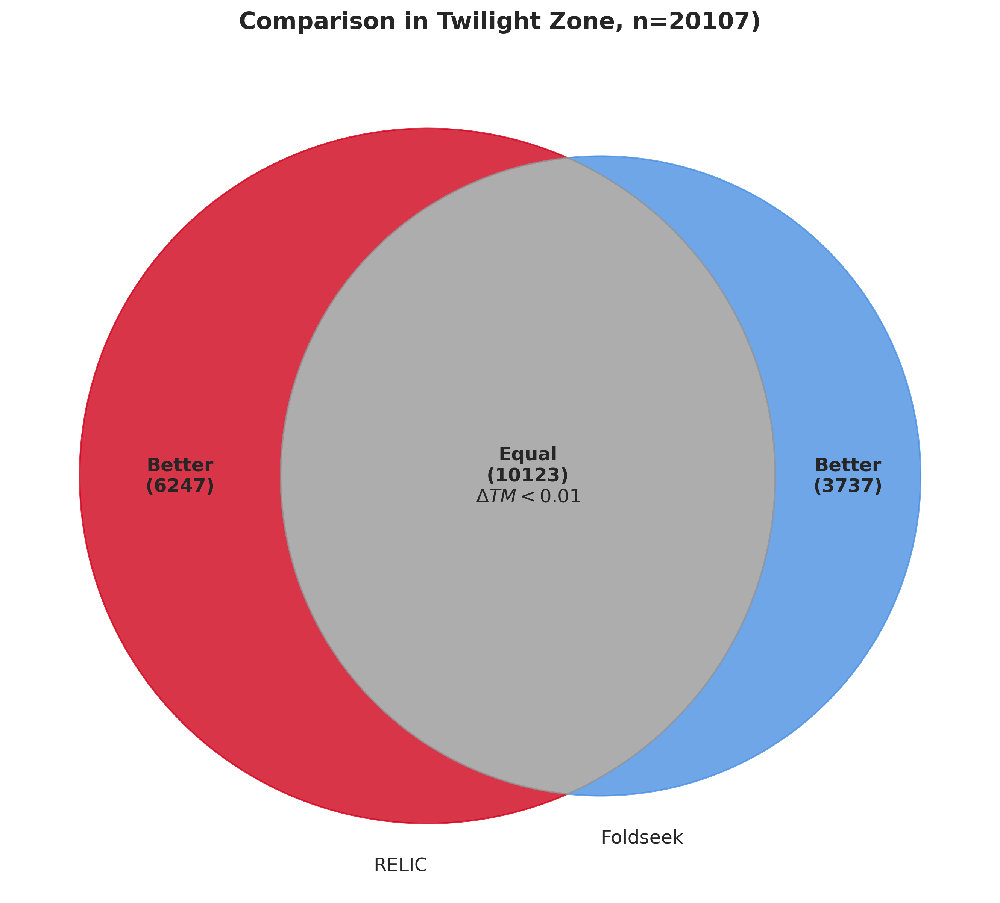

Twilight Zone pairs analyzed: 20107
RELIC Wins: 6247, Foldseek Wins: 3737, Equal: 10123


In [4]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import pandas as pd

df_twilight = df[df['Winner_Seq_Identity'] < 1].copy()

epsilon = 0.01
df_twilight['Diff'] = df_twilight['My_TM'] - df_twilight['Foldseek_TM']

win_count = len(df_twilight[df_twilight['Diff'] > epsilon])
loss_count = len(df_twilight[df_twilight['Diff'] < -epsilon])
equal_count = len(df_twilight[df_twilight['Diff'].abs() <= epsilon])

plt.figure(figsize=(9, 8), dpi=300)

v = venn2(subsets=(win_count, loss_count, equal_count), 
          set_labels=('RELIC', 'Foldseek'),
          alpha=0.8)

if v.get_patch_by_id('10'): v.get_patch_by_id('10').set_color(COLOR_WIN)
if v.get_patch_by_id('01'): v.get_patch_by_id('01').set_color(COLOR_LOSS)
if v.get_patch_by_id('11'): v.get_patch_by_id('11').set_color('#999999')

for area_id in ['10', '01', '11']:
    label = v.get_label_by_id(area_id)
    if label:
        label.set_fontsize(12)
        label.set_fontweight('bold')

        if area_id == '11':
            label.set_text(f'Equal\n({equal_count})\n$\Delta TM < {epsilon}$')
        elif area_id == '10':
            label.set_text(f'Better\n({win_count})')
        else:
            label.set_text(f'Better\n({loss_count})')

plt.title(f"Comparison in Twilight Zone, n={len(df_twilight)})", 
          fontsize=15, pad=20, fontweight='bold')

plt.gca().set_facecolor('white')

plt.tight_layout()
plt.show()

print(f"Twilight Zone pairs analyzed: {len(df_twilight)}")
print(f"RELIC Wins: {win_count}, Foldseek Wins: {loss_count}, Equal: {equal_count}")

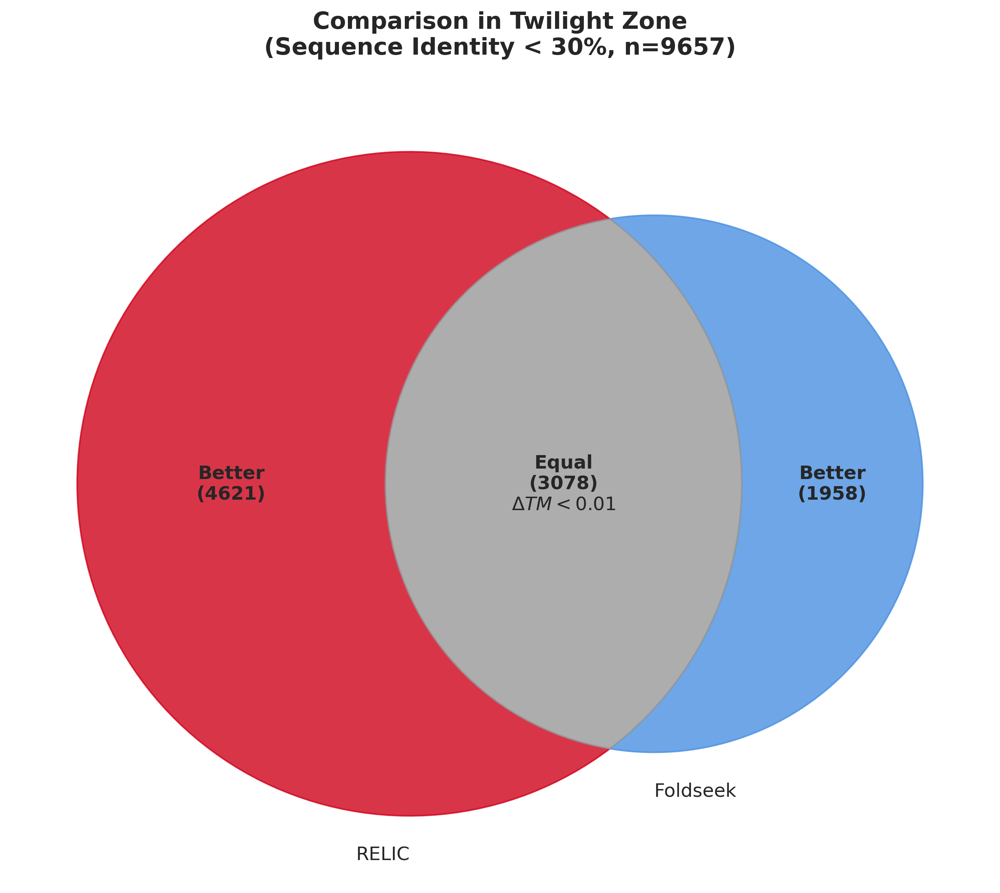

Twilight Zone pairs analyzed: 9657
RELIC Wins: 4621, Foldseek Wins: 1958, Equal: 3078


In [5]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import pandas as pd

df_twilight = df[df['Winner_Seq_Identity'] < 0.3].copy()

epsilon = 0.01
df_twilight['Diff'] = df_twilight['My_TM'] - df_twilight['Foldseek_TM']

win_count = len(df_twilight[df_twilight['Diff'] > epsilon])
loss_count = len(df_twilight[df_twilight['Diff'] < -epsilon])
equal_count = len(df_twilight[df_twilight['Diff'].abs() <= epsilon])

plt.figure(figsize=(9, 8), dpi=300)

v = venn2(subsets=(win_count, loss_count, equal_count), 
          set_labels=('RELIC', 'Foldseek'),
          alpha=0.8)

if v.get_patch_by_id('10'): v.get_patch_by_id('10').set_color(COLOR_WIN)
if v.get_patch_by_id('01'): v.get_patch_by_id('01').set_color(COLOR_LOSS)
if v.get_patch_by_id('11'): v.get_patch_by_id('11').set_color('#999999')

for area_id in ['10', '01', '11']:
    label = v.get_label_by_id(area_id)
    if label:
        label.set_fontsize(12)
        label.set_fontweight('bold')

        if area_id == '11':
            label.set_text(f'Equal\n({equal_count})\n$\Delta TM < {epsilon}$')
        elif area_id == '10':
            label.set_text(f'Better\n({win_count})')
        else:
            label.set_text(f'Better\n({loss_count})')

plt.title(f"Comparison in Twilight Zone\n(Sequence Identity < 30%, n={len(df_twilight)})", 
          fontsize=15, pad=20, fontweight='bold')

plt.gca().set_facecolor('white')

plt.tight_layout()
plt.show()

print(f"Twilight Zone pairs analyzed: {len(df_twilight)}")
print(f"RELIC Wins: {win_count}, Foldseek Wins: {loss_count}, Equal: {equal_count}")

## Figure 2D

Total pairs: 20215
Low Confidence / IDR queries (pLDDT < 70): 20215
In Low pLDDT region, ProtWord performs better in 7126 cases (35.25%)


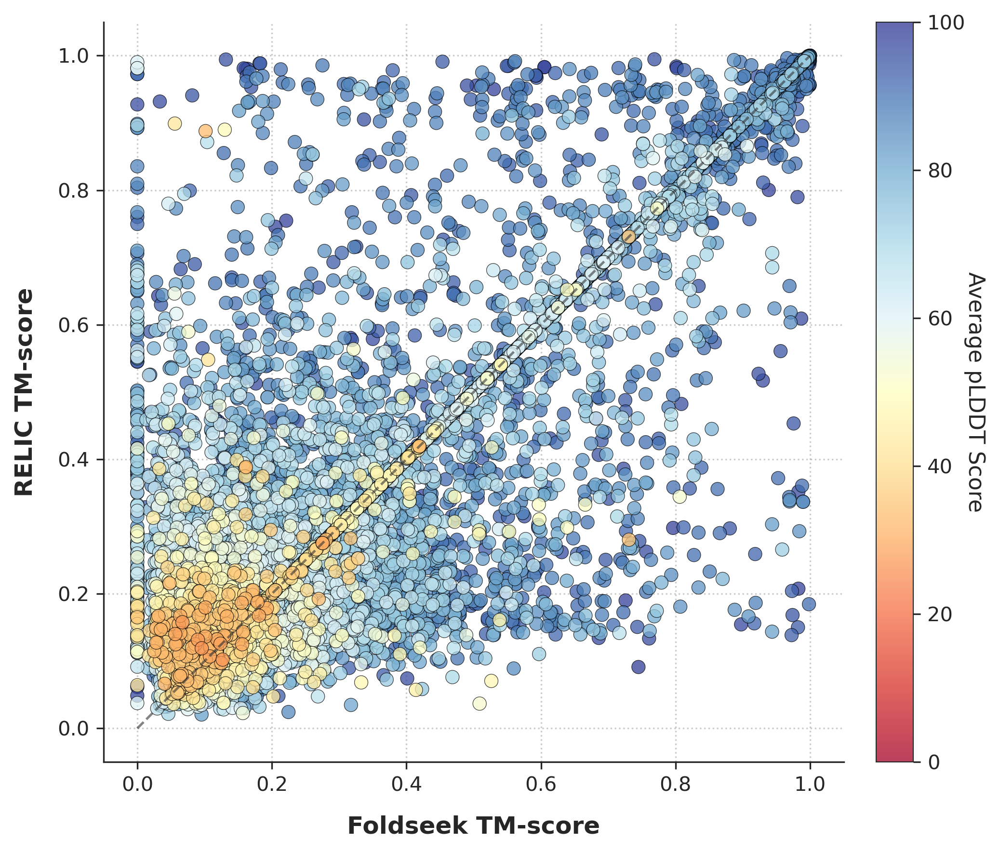

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

csv_file = "../RELIC_data/figure2A_D/Benchmark_With_Avg_pLDDT.csv"

df = pd.read_csv(csv_file)

df_sub = df[df['Query_Avg_pLDDT'] < 100].copy()

df_sub = df_sub.sort_values(by='Query_Avg_pLDDT', ascending=False)

print(f"Total pairs: {len(df)}")
print(f"Low Confidence / IDR queries (pLDDT < 70): {len(df_sub)}")

better_count = len(df_sub[df_sub['My_TM'] > df_sub['Foldseek_TM']])
win_rate = better_count / len(df_sub) * 100
print(f"In Low pLDDT region, ProtWord performs better in {better_count} cases ({win_rate:.2f}%)")

sns.set_style("ticks")
plt.rcParams['font.family'] = 'sans-serif'

fig, ax = plt.subplots(figsize=(7, 6), dpi=300)

scatter = ax.scatter(
    x=df_sub['Foldseek_TM'], 
    y=df_sub['My_TM'], 
    c=df_sub['Query_Avg_pLDDT'], 
    cmap='RdYlBu',      
    vmin=0, vmax=100,   
    s=45,               
    alpha=0.75,         
    edgecolors='k',     
    linewidth=0.3
)

ax.plot([0, 1], [0, 1], color='#333333', linestyle='--', linewidth=1.2, alpha=0.6, label='y=x')

sns.despine(top=True, right=True)

ax.set_xlim(-0.05, 1.05)
ax.set_ylim(-0.05, 1.05)
ax.set_xlabel('Foldseek TM-score', fontsize=12, fontweight='bold', labelpad=10)
ax.set_ylabel('RELIC TM-score', fontsize=12, fontweight='bold', labelpad=10)

ax.set_title('', fontsize=14, pad=15)

ax.grid(True, linestyle=':', alpha=0.4, color='gray', zorder=0)

cbar = plt.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Average pLDDT Score', fontsize=11, labelpad=10, rotation=270)
cbar.outline.set_linewidth(0.5)

plt.tight_layout()

plt.show()


## Figure 2E-F

/tmp/ipykernel_412298/1747159130.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])


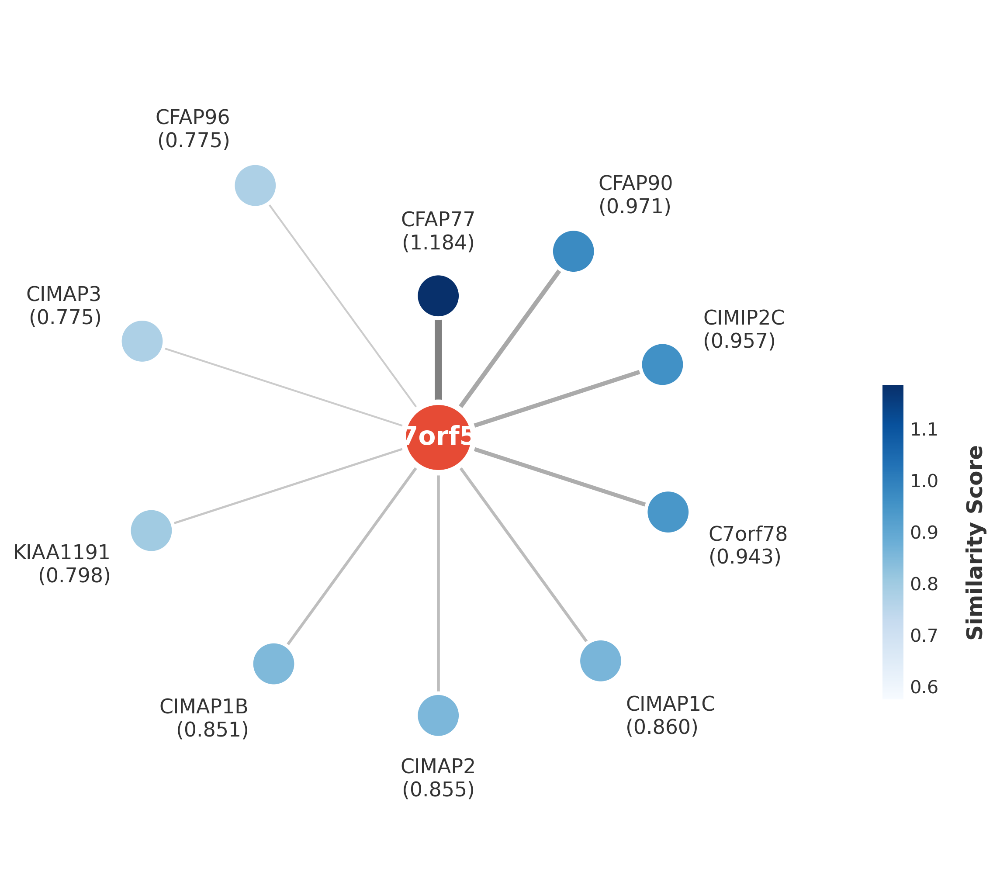

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable

center_protein = 'C7orf57' # Data From ../RELIC_data/figure2EF/all_vs_all_sw.tsv
data = {
    'CFAP77': 1.1844,
    'CFAP90': 0.97108,
    'CIMIP2C': 0.95729,
    'C7orf78': 0.94309,
    'CIMAP1C': 0.85959,
    'CIMAP2': 0.85522,
    'CIMAP1B': 0.85078,
    'KIAA1191': 0.7984,
    'CIMAP3': 0.77523,
    'CFAP96': 0.77514
}

sorted_data = sorted(data.items(), key=lambda x: x[1], reverse=True)
targets = [item[0] for item in sorted_data]
scores = np.array([item[1] for item in sorted_data])

n_targets = len(targets)

angles = np.linspace(np.pi / 2, np.pi / 2 - 2 * np.pi, n_targets, endpoint=False)

score_min, score_max = scores.min(), scores.max()
radii = 1.1 - 0.6 * ((scores - score_min) / (score_max - score_min))

x_coords = radii * np.cos(angles)
y_coords = radii * np.sin(angles)

plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
ax.axis('off')
ax.set_aspect('equal')

cmap = plt.get_cmap('Blues')
norm = mcolors.Normalize(vmin=score_min - 0.2, vmax=score_max)

for i in range(n_targets):

    lw = 1.0 + 3.0 * ((scores[i] - score_min) / (score_max - score_min))
    alpha = 0.4 + 0.6 * ((scores[i] - score_min) / (score_max - score_min))
    ax.plot([0, x_coords[i]], [0, y_coords[i]], color='#808080',
            linewidth=lw, alpha=alpha, zorder=1)

node_colors = [cmap(norm(score)) for score in scores]
ax.scatter(x_coords, y_coords, s=600, c=node_colors,
           edgecolors='white', linewidths=2, zorder=3)

ax.scatter(0, 0, s=1500, c='#E64B35', edgecolors='white', linewidths=3, zorder=4)
ax.text(0, 0, center_protein, ha='center', va='center',
        fontsize=14, fontweight='bold', color='white', zorder=5)

for i in range(n_targets):

    text_x = (radii[i] + 0.15) * np.cos(angles[i])
    text_y = (radii[i] + 0.15) * np.sin(angles[i])

    ha = 'left' if np.cos(angles[i]) > 0.1 else ('right' if np.cos(angles[i]) < -0.1 else 'center')
    va = 'bottom' if np.sin(angles[i]) > 0.1 else ('top' if np.sin(angles[i]) < -0.1 else 'center')

    label_text = f"{targets[i]}\n({scores[i]:.3f})"
    ax.text(text_x, text_y, label_text, ha=ha, va=va,
            fontsize=11, color='#333333', linespacing=1.2)
cbar_ax = fig.add_axes([0.85, 0.25, 0.02, 0.3])
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.outline.set_visible(False)
cbar.ax.tick_params(size=0, labelsize=10, labelcolor='#333333')
cbar.set_label('Similarity Score', fontsize=12, fontweight='bold', color='#333333', labelpad=15)

ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
plt.tight_layout(rect=[0, 0, 0.85, 1]) 

plt.show(block=True)

/tmp/ipykernel_412298/4057490850.py:82: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.85, 1])


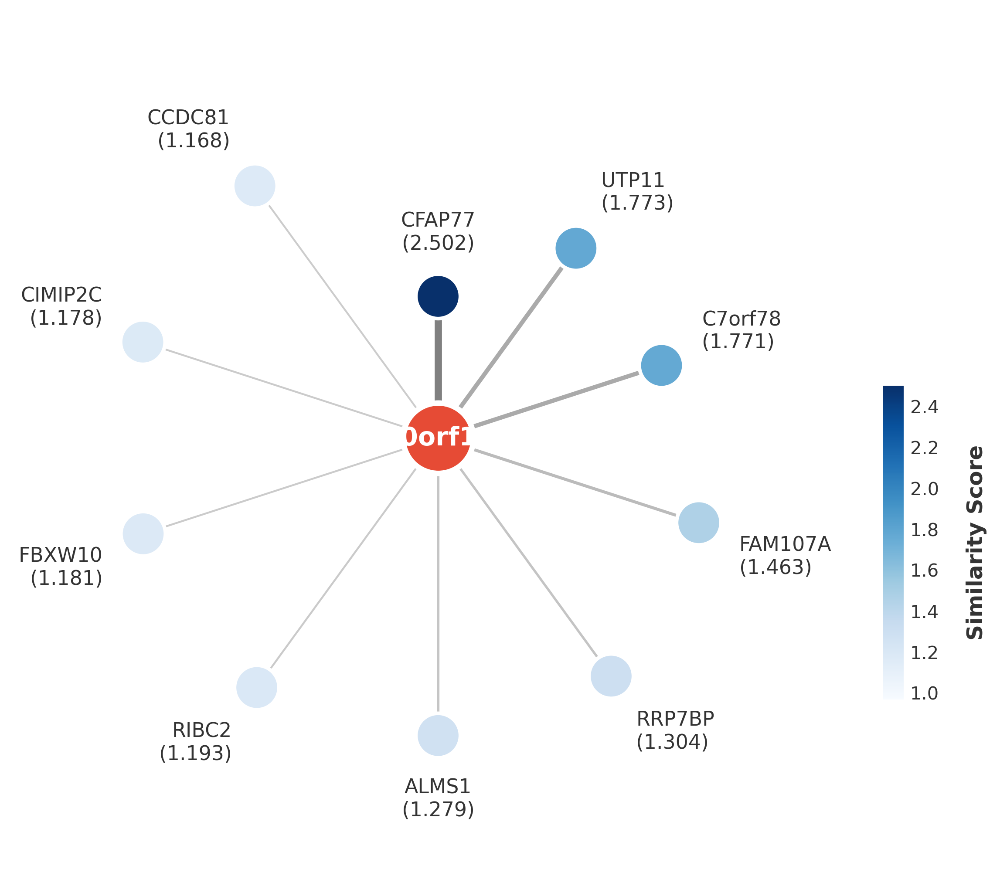

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.cm import ScalarMappable

center_protein = 'C10orf120'
data = {
    'CFAP77': 2.50208,
    'UTP11': 1.77303,
    'C7orf78': 1.77051,
    'FAM107A': 1.46295,
    'RRP7BP': 1.3037,
    'ALMS1': 1.27862,
    'RIBC2': 1.19322,
    'FBXW10': 1.1808,
    'CIMIP2C': 1.17784,
    'CCDC81': 1.16827
}

sorted_data = sorted(data.items(), key=lambda x: x[1], reverse=True)
targets = [item[0] for item in sorted_data]
scores = np.array([item[1] for item in sorted_data])

n_targets = len(targets)

angles = np.linspace(np.pi / 2, np.pi / 2 - 2 * np.pi, n_targets, endpoint=False)

score_min, score_max = scores.min(), scores.max()
radii = 1.1 - 0.6 * ((scores - score_min) / (score_max - score_min))

x_coords = radii * np.cos(angles)
y_coords = radii * np.sin(angles)

plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
ax.axis('off')
ax.set_aspect('equal')

cmap = plt.get_cmap('Blues')
norm = mcolors.Normalize(vmin=score_min - 0.2, vmax=score_max)

for i in range(n_targets):

    lw = 1.0 + 3.0 * ((scores[i] - score_min) / (score_max - score_min))
    alpha = 0.4 + 0.6 * ((scores[i] - score_min) / (score_max - score_min))
    ax.plot([0, x_coords[i]], [0, y_coords[i]], color='#808080',
            linewidth=lw, alpha=alpha, zorder=1)

node_colors = [cmap(norm(score)) for score in scores]
ax.scatter(x_coords, y_coords, s=600, c=node_colors,
           edgecolors='white', linewidths=2, zorder=3)

ax.scatter(0, 0, s=1500, c='#E64B35', edgecolors='white', linewidths=3, zorder=4)
ax.text(0, 0, center_protein, ha='center', va='center',
        fontsize=14, fontweight='bold', color='white', zorder=5)

for i in range(n_targets):

    text_x = (radii[i] + 0.15) * np.cos(angles[i])
    text_y = (radii[i] + 0.15) * np.sin(angles[i])

    ha = 'left' if np.cos(angles[i]) > 0.1 else ('right' if np.cos(angles[i]) < -0.1 else 'center')
    va = 'bottom' if np.sin(angles[i]) > 0.1 else ('top' if np.sin(angles[i]) < -0.1 else 'center')

    label_text = f"{targets[i]}\n({scores[i]:.3f})"
    ax.text(text_x, text_y, label_text, ha=ha, va=va,
            fontsize=11, color='#333333', linespacing=1.2)
cbar_ax = fig.add_axes([0.85, 0.25, 0.02, 0.3])
sm = ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.outline.set_visible(False)
cbar.ax.tick_params(size=0, labelsize=10, labelcolor='#333333')
cbar.set_label('Similarity Score', fontsize=12, fontweight='bold', color='#333333', labelpad=15)

ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
plt.tight_layout(rect=[0, 0, 0.85, 1]) 
plt.show(block=True)

## Figure J-K

In [17]:
import matplotlib.pyplot as plt
import pandas as pd
import trackpy as tp
import numpy as np
import cv2
import seaborn as sns
from tqdm.notebook import tqdm
import warnings

warnings.filterwarnings('ignore')

CONFIG = {
    'PIXEL_SIZE': 1.0,
    'TOTAL_FRAMES': 540,
    'TOTAL_TIME': 15.0,
    'THRESHOLD_VALUE': 80,
    'DIAMETER': 17,
    'MIN_MASS': 1000,
    'INVERT': False,
    'SEARCH_RANGE': 20,
    'MEMORY': 25,
    'ADAPTIVE_STEP': 0.95,
    'ADAPTIVE_STOP': 5,
    'MIN_FRAMES': 100,

    'ENABLE_DRIFT_FILTER': True,
    'DRIFT_ANGLE_TOLERANCE': 30,
    'DRIFT_LINEARITY_THRESHOLD': 0.7,
    'DRIFT_MAX_MASS': 5000, 
    'DRIFT_MAX_VCL': 120.0     
}

CONFIG['FPS'] = CONFIG['TOTAL_FRAMES'] / CONFIG['TOTAL_TIME']

PATH_DICT = {
    'WT_1': '../RELIC_data/figure2JK/wt1.avi', 
    'WT_2': '../RELIC_data/figure2JK/wt2.avi',
    'WT_3': '../RELIC_data/figure2JK/wt3.avi',
    'KO_1': '../RELIC_data/figure2JK/ko1.avi',
    'KO_2': '../RELIC_data/figure2JK/ko2.avi',
    'KO_3': '../RELIC_data/figure2JK/ko3.avi',
}

def filter_specific_drift(t, cfg):
    if len(t) == 0: return t
    print("  -> Vertical Filtering...")
    original_count = t['particle'].nunique()
    particle_stats = []
    
    for pid, p_data in t.groupby('particle'):
        start = p_data.iloc[0]
        end = p_data.iloc[-1]

        dx = end['x'] - start['x']
        dy = end['y'] - start['y']

        angle_rad = np.arctan2(dy, dx)
        angle_deg = np.degrees(angle_rad) 

        dist_straight = np.sqrt(dx**2 + dy**2)
        total_time = (p_data['frame'].max() - p_data['frame'].min()) / cfg['FPS']
        vsl = (dist_straight * cfg['PIXEL_SIZE']) / total_time if total_time > 0 else 0

        vcl = p_data['vcl_smooth'].mean()
        linearity = vsl / vcl if vcl > 0 else 0
        mean_mass = p_data['mass'].mean()
        
        particle_stats.append({
            'particle': pid,
            'angle': angle_deg,
            'linearity': linearity,
            'vcl': vcl,
            'mass': mean_mass
        })
    
    df_stats = pd.DataFrame(particle_stats)
    is_vertical = (np.abs(df_stats['angle']) >= 90 - cfg['DRIFT_ANGLE_TOLERANCE']) & \
                  (np.abs(df_stats['angle']) <= 90 + cfg['DRIFT_ANGLE_TOLERANCE'])
    is_straight = df_stats['linearity'] > cfg['DRIFT_LINEARITY_THRESHOLD']
    is_slowish = df_stats['vcl'] < cfg['DRIFT_MAX_VCL']
    is_small = df_stats['mass'] < cfg['DRIFT_MAX_MASS']
    drift_particles = df_stats[is_vertical & is_straight & is_slowish & is_small]['particle'].values

    t_clean = t[~t['particle'].isin(drift_particles)]
    
    removed_count = original_count - t_clean['particle'].nunique()
    print(f"  ->  {removed_count} trajectories removed (Linearity>{cfg['DRIFT_LINEARITY_THRESHOLD']}, Quality<{cfg['DRIFT_MAX_MASS']})")
    
    return t_clean

class CV2VideoReader:
    def __init__(self, filename, to_gray=True, threshold=None):
        self.cap = cv2.VideoCapture(filename)
        if not self.cap.isOpened(): raise IOError(f"Cannot open: {filename}")
        self.frame_count = int(self.cap.get(cv2.CAP_PROP_FRAME_COUNT))
        self.to_gray = to_gray
        self.threshold = threshold
    def __len__(self): return self.frame_count
    def __getitem__(self, index):
        if isinstance(index, slice): return [self[i] for i in range(*index.indices(self.frame_count))]
        self.cap.set(cv2.CAP_PROP_POS_FRAMES, index)
        ret, frame = self.cap.read()
        if not ret: raise IndexError(f"Error reading frame {index}")
        if self.to_gray and len(frame.shape) == 3: frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        if self.threshold is not None: _, frame = cv2.threshold(frame, self.threshold, 255, cv2.THRESH_TOZERO)
        return frame
    def close(self): self.cap.release()
    def get_first_frame(self): return self[0]

def analyze_single_video(name, path, cfg):
    print(f"\nProcessing: {name} ...")
    frames = CV2VideoReader(path, to_gray=True, threshold=cfg['THRESHOLD_VALUE'])
    first_frame = frames.get_first_frame() 

    f = tp.batch(frames, diameter=cfg['DIAMETER'], minmass=cfg['MIN_MASS'], 
                 invert=cfg['INVERT'], processes=1)
    t = tp.link(f, search_range=cfg['SEARCH_RANGE'], memory=cfg['MEMORY'],
                adaptive_step=cfg['ADAPTIVE_STEP'], adaptive_stop=cfg['ADAPTIVE_STOP'])
    t = tp.filter_stubs(t, cfg['MIN_FRAMES'])
    t = t.reset_index(drop=True)
    t = t.sort_values(['particle', 'frame'])
    
    grouped = t.groupby('particle', group_keys=False)
    t['x_um'] = t['x'] * cfg['PIXEL_SIZE']
    t['y_um'] = t['y'] * cfg['PIXEL_SIZE']
    t['dx'] = grouped['x_um'].diff()
    t['dy'] = grouped['y_um'].diff()
    t['dist_step'] = np.sqrt(t['dx']**2 + t['dy']**2)
    t['vcl_inst'] = t['dist_step'] * cfg['FPS']
    t['vcl_smooth'] = grouped['vcl_inst'].transform(
        lambda x: x.rolling(window=5, center=True, min_periods=1).mean()
    ).fillna(0)

    if cfg.get('ENABLE_DRIFT_FILTER', False):
        t = filter_specific_drift(t, cfg)
        
    frames.close()
    return t, first_frame

results_db = {} 

print(f"Analyzing {len(PATH_DICT)} in total ......")
print(f"Vertical filter {'Open' if CONFIG['ENABLE_DRIFT_FILTER'] else 'Close'}")

for group_name, video_path in tqdm(PATH_DICT.items()):
    try:
        traj_df, bg_img = analyze_single_video(group_name, video_path, CONFIG)
        
        if traj_df.empty:
            print(f"  -> {group_name} error")
            continue

        stats = traj_df.groupby('particle')['vcl_smooth'].mean().reset_index()
        stats.rename(columns={'vcl_smooth': 'VCL_mean'}, inplace=True)
        
        def calc_vsl(g):
            if len(g) < 2: return 0
            start_pt = g.iloc[0][['x_um', 'y_um']].values
            end_pt = g.iloc[-1][['x_um', 'y_um']].values
            dist = np.linalg.norm(end_pt - start_pt)
            time = (g.iloc[-1]['frame'] - g.iloc[0]['frame']) / CONFIG['FPS']
            return dist / time if time > 0 else 0

        vsl_series = traj_df.groupby('particle').apply(calc_vsl)
        vsl_df = vsl_series.reset_index(name='VSL_mean')

        stats = pd.merge(stats, vsl_df, on='particle')
        stats['Linearity'] = stats['VSL_mean'] / stats['VCL_mean']

        stats['Sample'] = group_name 
        stats['Genotype'] = 'WT' if 'WT' in group_name else 'KO'
        
        results_db[group_name] = {
            'traj': traj_df,
            'bg': bg_img,
            'stats': stats
        }
        print(f"  -> {group_name}:{len(stats)}。")
        
    except Exception as e:
        print(f"{group_name}: {e}")
        import traceback
        traceback.print_exc()

all_stats = pd.concat([res['stats'] for res in results_db.values()], ignore_index=True)
summary_table = all_stats.groupby('Genotype')[['VCL_mean', 'VSL_mean', 'Linearity']].mean()


Frame 539: 436 trajectories present.
  -> 正在进行竖向漂移小颗粒过滤...
  -> 已移除 65 个竖向漂移轨迹 (直线性>0.7, 质量<5000)
  -> KO_3:454。


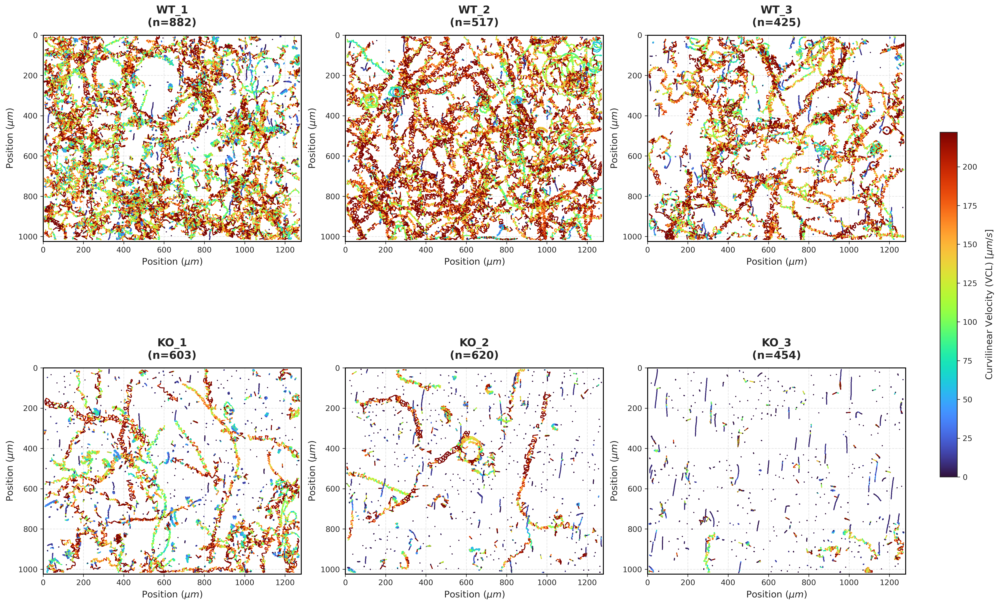

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.interpolate as interp
from matplotlib.collections import LineCollection
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

def plot_multi_trajectories_pub_quality(results, cfg):
    CMAP_NAME = 'turbo' 
    LINE_WIDTH = 1.2
    INTERP_FACTOR = 5 
    n = len(results)
    cols = 3 if n > 1 else 1
    rows = int(np.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 6 * rows), 
                             constrained_layout=True, dpi=300)
    
    if n == 1: 
        axes = [axes]
    else: 
        axes = axes.flatten()

    all_vcl = []
    for res in results.values():
        if not res['traj'].empty:
            all_vcl.extend(res['traj']['vcl_smooth'].values)
            
    if not all_vcl:
        print("no Trajectory")
        return
        
    v_max = np.percentile(all_vcl, 98)
    norm = Normalize(vmin=0, vmax=v_max)
    
    for ax, (name, data) in zip(axes, results.items()):
        traj = data['traj']

        h_px, w_px = data['bg'].shape[:2]
        h_um, w_um = h_px * cfg['PIXEL_SIZE'], w_px * cfg['PIXEL_SIZE']
        
        segments_all = []
        velocities_all = []
        
        if not traj.empty:
            for pid, p_data in traj.groupby('particle'):
                x = p_data['x_um'].values
                y = p_data['y_um'].values
                v = p_data['vcl_smooth'].values

                if len(x) > 3:
                    t = np.arange(len(x))
                    t_new = np.linspace(0, len(x)-1, len(x) * INTERP_FACTOR)
                    try:
                        bspl_x = interp.make_interp_spline(t, x, k=3)
                        bspl_y = interp.make_interp_spline(t, y, k=3)
                        bspl_v = interp.make_interp_spline(t, v, k=3)
                        
                        x_smooth = bspl_x(t_new)
                        y_smooth = bspl_y(t_new)
                        v_smooth = bspl_v(t_new)
                        
                        points = np.array([x_smooth, y_smooth]).T.reshape(-1, 1, 2)
                        segs = np.concatenate([points[:-1], points[1:]], axis=1)
                        
                        segments_all.append(segs)
                        velocities_all.append(v_smooth[:-1])
                    except Exception:
                        points = np.array([x, y]).T.reshape(-1, 1, 2)
                        segs = np.concatenate([points[:-1], points[1:]], axis=1)
                        segments_all.append(segs)
                        velocities_all.append(v[:-1])
                else:
                    points = np.array([x, y]).T.reshape(-1, 1, 2)
                    segs = np.concatenate([points[:-1], points[1:]], axis=1)
                    segments_all.append(segs)
                    velocities_all.append(v[:-1])

            if segments_all:
                lc = LineCollection(
                    np.concatenate(segments_all), 
                    cmap=CMAP_NAME, 
                    norm=norm, 
                    linewidth=LINE_WIDTH,
                    capstyle='round',
                    joinstyle='round'
                )
                lc.set_array(np.concatenate(velocities_all))
                ax.add_collection(lc)

        particle_count = len(data['stats']) if 'stats' in data else 0
        ax.set_title(f"{name}\n(n={particle_count})", fontsize=14, weight='bold', pad=12)
        ax.set_aspect('equal') 
        ax.set_xlim(0, w_um)
        ax.set_ylim(h_um, 0)

        ax.set_xlabel(r"Position ($\mu m$)", fontsize=12)
        ax.set_ylabel(r"Position ($\mu m$)", fontsize=12)
        ax.set_facecolor('white')
        ax.grid(True, linestyle='--', color='gray', alpha=0.2, linewidth=0.8)
        
        for spine in ax.spines.values():
            spine.set_linewidth(1.2)
            spine.set_color('black')

    for i in range(n, len(axes)):
        axes[i].axis('off')

    sm = ScalarMappable(norm=norm, cmap=CMAP_NAME)
    sm.set_array([])
    cbar = fig.colorbar(sm, ax=axes, orientation='vertical', fraction=0.02, pad=0.04)
    cbar.set_label(r'Curvilinear Velocity (VCL) [$\mu m/s$]', fontsize=12, labelpad=10)
    cbar.outline.set_linewidth(1)
    plt.show()

plot_multi_trajectories_pub_quality(results_db, CONFIG)

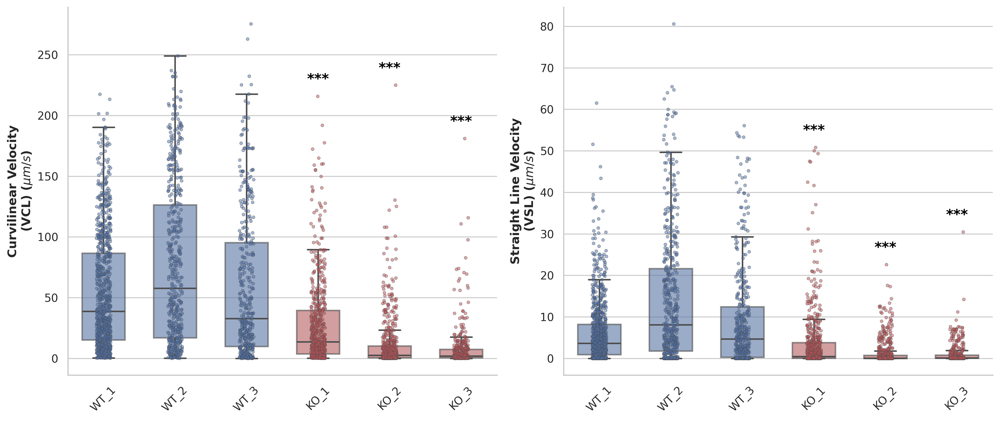


  Non-parametric Statistics Report (Individual KO vs Pooled WT)

>>> Metric: VCL_mean
  [Global Kruskal-Wallis Test across 6 groups] P-value = 9.9894e-258
  -----------------------------------------------------------------
  Group      | Mean ± Std           | Median     | N     | P-value (vs WT)
  -----------------------------------------------------------------
  Pooled WT  |  61.29 ±  56.38   |  41.78     | 1824  | Baseline
    - WT_1   |  54.23 ±  47.27   |  38.75     | 882   | -
    - WT_2   |  76.41 ±  65.16   |  57.80     | 517   | -
    - WT_3   |  57.55 ±  58.69   |  32.90     | 425   | -
  -----------------------------------------------------------------
  KO_1       |  28.01 ±  35.30   |  13.60     | 603   | 6.2030e-48 (***)
  KO_2       |  11.20 ±  21.51   |   2.54     | 620   | 1.6866e-152 (***)
  KO_3       |   7.63 ±  16.73   |   2.08     | 454   | 1.6471e-144 (***)
  -----------------------------------------------------------------

>>> Metric: VSL_mean
  [Global Krusk

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import mannwhitneyu, kruskal

def analyze_and_plot_split_all(results):
    all_stats = []
    for name, data in results.items():
        df = data['stats'].copy()
        if 'Group' not in df.columns:
            df['Group'] = name
        df['Genotype'] = 'WT' if 'WT' in name.upper() else 'KO'
        all_stats.append(df)
    
    if not all_stats:
        print("no data")
        return pd.DataFrame()
        
    combined_df = pd.concat(all_stats, ignore_index=True)

    unique_groups = combined_df['Group'].unique()
    wt_groups = sorted([g for g in unique_groups if 'WT' in g.upper()])
    ko_groups = sorted([g for g in unique_groups if 'KO' in g.upper()])
    order = wt_groups + ko_groups

    palette = {g: '#4C72B0' if 'WT' in g.upper() else '#C44E52' for g in order}

    fig, axes = plt.subplots(1, 2, figsize=(14, 6), dpi=300)
    sns.set_theme(style="whitegrid", rc={"axes.facecolor": "white", "figure.facecolor": "white"})
    
    metrics_map = [
        {'col': 'VCL_mean', 'name': 'Curvilinear Velocity\n(VCL)', 'ax': axes[0]},
        {'col': 'VSL_mean', 'name': 'Straight Line Velocity\n(VSL)', 'ax': axes[1]}
    ]
    
    for item in metrics_map:
        col = item['col']
        ax = item['ax']
        name_text = item['name']

        sns.boxplot(data=combined_df, x='Group', y=col, hue='Group', order=order,
                    palette=palette, width=0.6, showfliers=False, dodge=False,
                    boxprops=dict(alpha=0.6), ax=ax)

        sns.stripplot(data=combined_df, x='Group', y=col, hue='Group', order=order,
                      palette=palette, jitter=True, size=3, alpha=0.5, dodge=False,
                      edgecolor='gray', linewidth=0.5, ax=ax)

        if ax.get_legend() is not None:
            ax.get_legend().remove()
            
        ax.set_ylabel(r"%s ($\mu m/s$)" % name_text, fontsize=12, fontweight='bold')
        ax.set_xlabel("")
        ax.tick_params(axis='x', rotation=45, labelsize=11)

        pooled_wt_data = combined_df[combined_df['Genotype'] == 'WT'][col].dropna()
        y_range = combined_df[col].max() - combined_df[col].min()
        
        if len(pooled_wt_data) > 0:
            for i, group in enumerate(order):
                if group in ko_groups:
                    ko_data = combined_df[combined_df['Group'] == group][col].dropna()
                    
                    if len(ko_data) > 0:
                        stat, p_val = mannwhitneyu(pooled_wt_data, ko_data, alternative='two-sided')
                        
                        if p_val < 0.001: sig = "***"
                        elif p_val < 0.01: sig = "**"
                        elif p_val < 0.05: sig = "*"
                        else: sig = ""
                        
                        if sig:
                            star_y = ko_data.max() + (y_range * 0.03)
                            ax.text(i, star_y, sig, ha='center', va='bottom', 
                                    color='black', fontsize=14, fontweight='bold')

    sns.despine()
    plt.tight_layout()
    plt.show()

    print("\n" + "="*70)
    print("  Non-parametric Statistics Report (Individual KO vs Pooled WT)")
    print("="*70)
    
    for col in ['VCL_mean', 'VSL_mean']:
        print(f"\n>>> Metric: {col}")
        pooled_wt = combined_df[combined_df['Genotype'] == 'WT'][col].dropna().values
        all_group_data = [combined_df[combined_df['Group'] == g][col].dropna().values for g in order]
        k_stat, k_pval = kruskal(*all_group_data)
        print(f"  [Global Kruskal-Wallis Test across 6 groups] P-value = {k_pval:.4e}")
        print(f"  {'-'*65}")
        print(f"  {'Group':<10} | {'Mean ± Std':<20} | {'Median':<10} | {'N':<5} | P-value (vs WT)")
        print(f"  {'-'*65}")
        print(f"  {'Pooled WT':<10} | {pooled_wt.mean():6.2f} ± {pooled_wt.std():6.2f}   | {np.median(pooled_wt):6.2f}     | {len(pooled_wt):<5} | Baseline")
        for g in wt_groups:
            d = combined_df[combined_df['Group'] == g][col].dropna().values
            print(f"    - {g:<6} | {d.mean():6.2f} ± {d.std():6.2f}   | {np.median(d):6.2f}     | {len(d):<5} | -")
            
        print(f"  {'-'*65}")

        for g in ko_groups:
            d = combined_df[combined_df['Group'] == g][col].dropna().values
            if len(d) > 0 and len(pooled_wt) > 0:
                u_stat, p_val = mannwhitneyu(pooled_wt, d, alternative='two-sided')
                if p_val < 0.001: sig = "***"
                elif p_val < 0.01: sig = "**"
                elif p_val < 0.05: sig = "*"
                else: sig = "ns"
                print(f"  {g:<10} | {d.mean():6.2f} ± {d.std():6.2f}   | {np.median(d):6.2f}     | {len(d):<5} | {p_val:.4e} ({sig})")
            else:
                print(f"  {g:<10} | No Data")
                
        print(f"  {'-'*65}")

    return combined_df

final_df = analyze_and_plot_split_all(results_db)